<a href="https://colab.research.google.com/github/byteshiva/cv2-image-transformations/blob/main/FaceDetection_CV2_Image_Processor.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!apt update 

Hit:1 http://archive.ubuntu.com/ubuntu focal InRelease
Get:2 http://archive.ubuntu.com/ubuntu focal-updates InRelease [114 kB]
Get:3 http://archive.ubuntu.com/ubuntu focal-backports InRelease [108 kB]
Get:4 http://security.ubuntu.com/ubuntu focal-security InRelease [114 kB]
Get:5 https://cloud.r-project.org/bin/linux/ubuntu focal-cran40/ InRelease [3,622 B]
Hit:6 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu focal InRelease
Get:7 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  InRelease [1,581 B]
Hit:8 http://ppa.launchpad.net/cran/libgit2/ubuntu focal InRelease
Hit:9 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu focal InRelease
Get:10 http://archive.ubuntu.com/ubuntu focal-updates/universe amd64 Packages [1,323 kB]
Hit:11 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu focal InRelease
Get:12 http://archive.ubuntu.com/ubuntu focal-updates/main amd64 Packages [3,069 kB]
Hit:13 http://ppa.launchpad.net/ubuntugis/ppa/ubuntu focal InRelease
Get:14 h

In [2]:
!apt upgrade -y

Reading package lists... Done
Building dependency tree       
Reading state information... Done
Calculating upgrade... Done
The following packages have been kept back:
  libcudnn8 libcudnn8-dev libnccl-dev libnccl2
The following packages will be upgraded:
  base-files cuda-toolkit-config-common libasn1-8-heimdal libgnutls30
  libgssapi3-heimdal libhcrypto4-heimdal libheimbase1-heimdal
  libheimntlm0-heimdal libhx509-5-heimdal libkrb5-26-heimdal libpam-modules
  libpam-modules-bin libpam-runtime libpam0g libroken18-heimdal
  libwind0-heimdal linux-libc-dev openssl tar
19 upgraded, 0 newly installed, 0 to remove and 4 not upgraded.
Need to get 4,104 kB of archives.
After this operation, 36.9 kB of additional disk space will be used.
Get:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  cuda-toolkit-config-common 12.1.55-1 [16.4 kB]
Get:2 http://archive.ubuntu.com/ubuntu focal-updates/main amd64 base-files amd64 11ubuntu5.7 [60.4 kB]
Get:3 http://archive.ubuntu

In [3]:
!git clone https://github.com/byteshiva/cv2-image-transformations.git

Cloning into 'cv2-image-transformations'...
remote: Enumerating objects: 49, done.
remote: Counting objects: 100% (49/49), done.
remote: Compressing objects: 100% (45/45), done.
remote: Total 49 (delta 20), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (49/49), 1.89 MiB | 7.43 MiB/s, done.


In [4]:
cd cv2-image-transformations

/content/cv2-image-transformations


In [5]:
!pip install -r requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.1/100.1 MB 9.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566185 sha256=7bdc888347398aa6884f4e5d07966ddc3d1235594471efc81ea5e18db1a82a15
  Stored in directory: /root/.cache/pip/wheels/22/a8/60/4a2aeb763d63f50190f4c4e07069a22245347eeafdb3a67551
Successfully built face-recognition-models


In [6]:
cat faceRecognizer.py

import cv2
import face_recognition
import numpy as np
from typing import Dict, List, Tuple
from PIL import Image


class FaceRecognizer:
    def __init__(self, known_faces: Dict[str, face_recognition.face_encodings], unknown_color: Tuple[int,int,int]=(0,0,255)):
        self.known_faces = known_faces
        self.unknown_color = unknown_color
    
    def label_faces(self, image: np.ndarray) -> np.ndarray:
        # Convert the image from BGR color (which OpenCV uses) to RGB color (which face_recognition uses)
        rgb_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Find all the faces in the image
        face_locations = face_recognition.face_locations(rgb_image)
        face_encodings = face_recognition.face_encodings(rgb_image, face_locations)

        # Label the faces
        for (top, right, bottom, left), face_encoding in zip(face_locations, face_encodings):
            # Initialize a variable to store the name of the person
            name = "Unknown"

           

### The code is a facial recognition program that takes an image and compares the faces in it with known faces, labeling the recognized faces and drawing a rectangle around them in green, while unknown faces are labeled in red and boxed in blue.





In [7]:
!python faceRecognizer.py

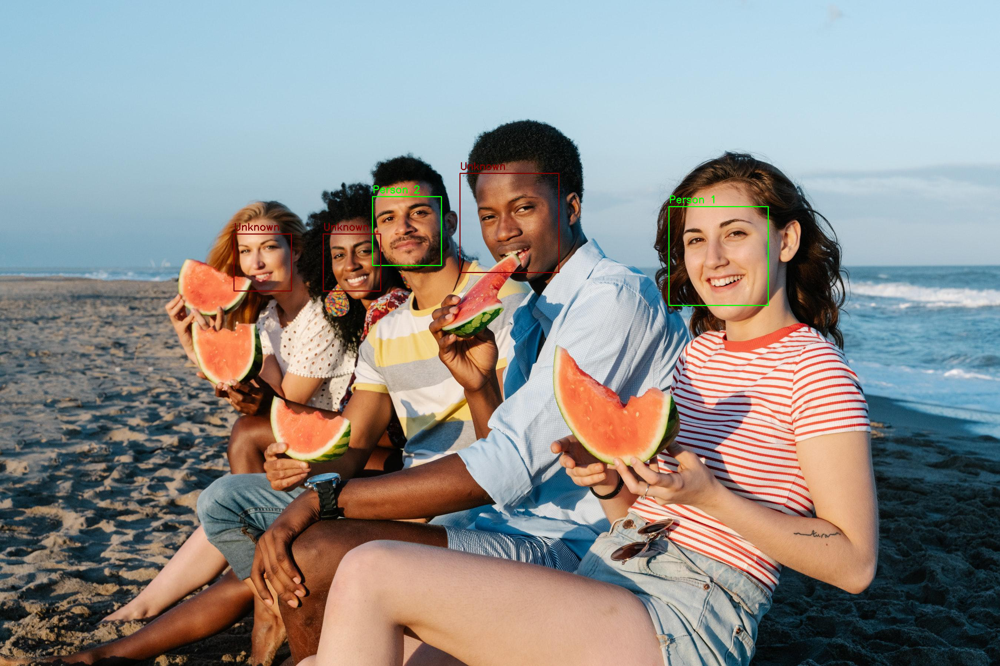

In [8]:
from PIL import Image
from IPython.display import display

import matplotlib.pyplot as plt

# Load the image
img = Image.open("img/labeled_peoples.jpg")

# Show the image using matplotlib
display(img)


### The code defines a class ImageProcessor that performs various image processing operations including loading and saving images, rotating, flipping, resizing, and blurring. It also demonstrates the use of numpy arrays to save and load image data from disk. Finally, it creates several instances of the class and applies different image transformations to them before displaying and saving the processed images.





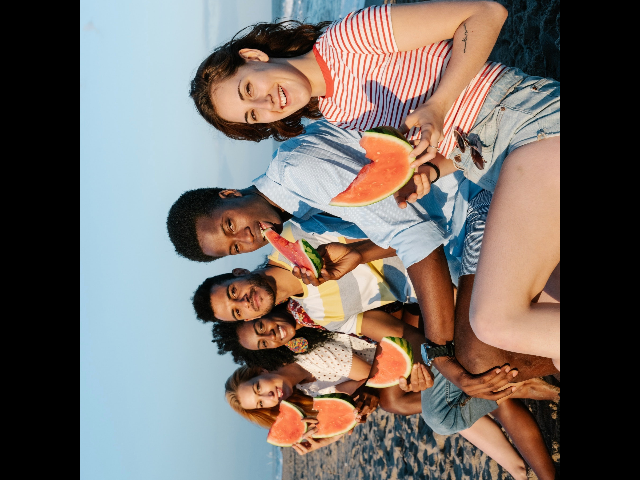

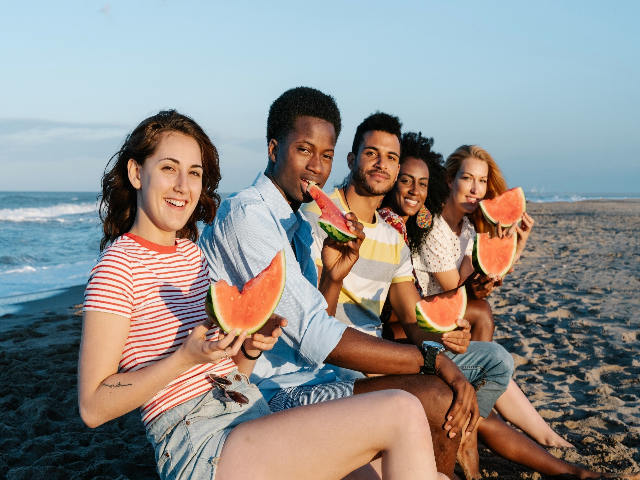

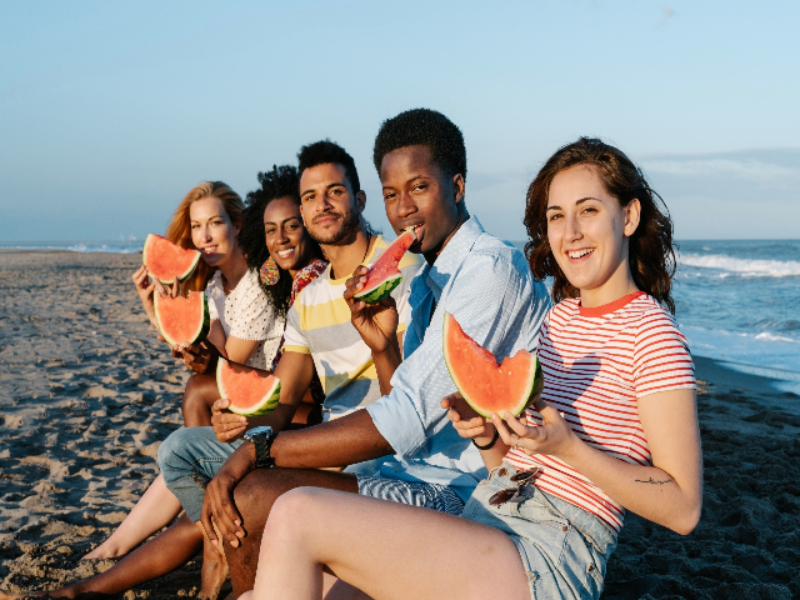

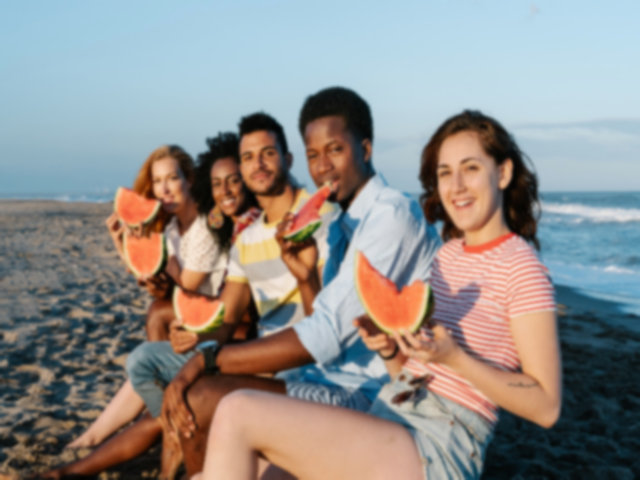

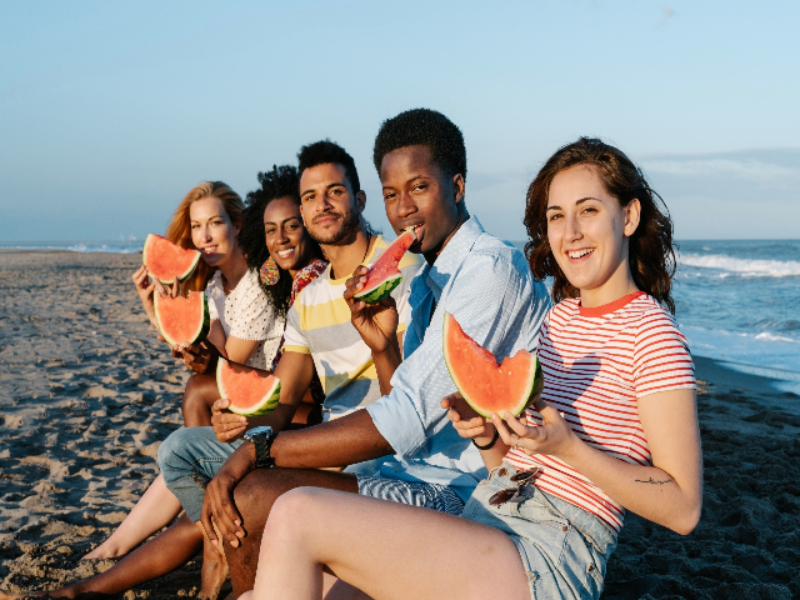

In [9]:
import numpy as np
import cv2
import os
from google.colab.patches import cv2_imshow

class ImageProcessor:
    
    def __init__(self, filename):
        self.filename = filename
        self.load_image()
    
    def load_image(self):
        # Load the image and resize it
        self.img = cv2.imread(self.filename)
        self.img = cv2.resize(self.img, (640, 480))
        
    def save_numpy_array(self, filepath):
        # Convert the image to a numpy array and save it
        img_array = cv2.resize(self.img, (128, 96))
        np.save(filepath, img_array)
    
    def delete_image(self):
        # Delete the original image
        os.remove(self.filename)
    
    def load_numpy_array(self, filepath):
        # Load the numpy array from disk and resize it
        img_array = np.load(filepath)
        self.img = cv2.resize(img_array, (640, 480))
    
    def convert_to_image(self):
        # Convert the numpy array back to an image
        self.img = cv2.cvtColor(self.img, cv2.COLOR_RGB2BGR)
    
    def save_image(self, filename):
        # Save the image to disk and resize it
        img_resized = cv2.resize(self.img, (1280, 960))
        cv2.imwrite(filename, img_resized)
    
    def rotate(self, angle):
        # Rotate the image by the specified angle
        self.img = self._rotate_image(self.img, angle)
    
    def _rotate_image(self, image, angle):
        rows, cols = image.shape[:2]
        M = cv2.getRotationMatrix2D((cols/2,rows/2),angle,1)
        return cv2.warpAffine(image, M, (cols,rows))
    
    def flip_horizontal(self):
        # Flip the image horizontally
        self.img = np.flip(self.img, axis=1)
    
    def flip_vertical(self):
        # Flip the image vertically
        self.img = np.flip(self.img, axis=0)
    
    def resize(self, width, height):
        # Resize the image to a new width and height
        self.img = cv2.resize(self.img, (width, height))
    
    def blur(self, kernel_size):
        # Blur the image
        self.img = cv2.GaussianBlur(self.img, (kernel_size, kernel_size), 0)
    
    def show_image(self):
        # Display the image
        cv2_imshow(self.img)

IMG_DIR="./img/"
IMG_SOURCE=IMG_DIR + 'example2.jpg'
IMG_OUTPUT_NPY=IMG_DIR + 'example.npy'

IMG_OUTPUT_PROCESSED=IMG_DIR + 'example_processed.jpg'

# Create an instance of the ImageProcessor class
img_processor = ImageProcessor(IMG_SOURCE)

# Save the image as a numpy array and delete the original image
img_processor.save_numpy_array(IMG_OUTPUT_NPY)
# img_processor.delete_image()

# Load the numpy array and convert it back to an image
img_processor.load_numpy_array(IMG_OUTPUT_NPY)
img_processor.convert_to_image()

# Create a new instance of the ImageProcessor class and rotate the image
img_processor_rotate = ImageProcessor(IMG_SOURCE)
img_processor_rotate.rotate(90)
img_processor_rotate.show_image()


# Create another new instance of the ImageProcessor class and flip the image horizontally
img_processor_flip = ImageProcessor(IMG_SOURCE)
img_processor_flip.flip_horizontal()
img_processor_flip.show_image()

# Create yet another new instance of the Image class and resize the image 
img_processor_resize = ImageProcessor(IMG_SOURCE)
img_processor_resize.resize(800, 600)
img_processor_resize.show_image()

# Create yet another new instance of the Image class and blur the image 
img_processor_blur = ImageProcessor(IMG_SOURCE)
img_processor_blur.blur(7)
img_processor_blur.show_image()

img_processor_resize.save_image(IMG_OUTPUT_PROCESSED)
img_processor_resize.show_image()
